In [1]:
from PIL import Image
import requests
import torch
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from transformers import CLIPProcessor, CLIPModel
import seaborn as sns
import matplotlib.pyplot as plt

# Read file from test set

In [2]:
from pycocotools.coco import COCO
import os
HOME = os.getcwd()
dataset = os.path.join(HOME, 'MedicineBoxes-2')

ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset, "train")
VAL_DIRECTORY = os.path.join(dataset, "valid")
TEST_DIRECTORY = os.path.join(dataset, "test")

path = os.path.join(TRAIN_DIRECTORY, ANNOTATION_FILE_NAME)


In [3]:
path = os.path.join(TRAIN_DIRECTORY, ANNOTATION_FILE_NAME)

from pycocotools.coco import COCO
import collections



# Initialize COCO object with the annotation file
coco = COCO(path)

# Get the category IDs
category_ids = coco.getCatIds()

# Get the category names
categories = coco.loadCats(category_ids)

# Create a dictionary to store the count of images per class
image_count_per_class = collections.defaultdict(int)

# Iterate over all category IDs and count how many images have annotations for each category
for category in categories:
    category_id = category['id']
    
    # Get annotation IDs for the category
    ann_ids = coco.getAnnIds(catIds=[category_id])
    
    # Get the unique image IDs for the category
    img_ids = set([ann['image_id'] for ann in coco.loadAnns(ann_ids)])
    
    # Count the number of unique images for this category
    image_count_per_class[category['name']] = len(img_ids)

print(len(image_count_per_class))
image_count_per_class

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
42


defaultdict(int,
            {'Boxes': 0,
             'aferin': 33,
             'aljil': 7,
             'apodonorm5mg': 10,
             'apodorm5mg': 6,
             'apranax': 51,
             'arveles': 53,
             'aspirin': 33,
             'betasalic': 1,
             'box': 62,
             'buprefarm5ug_hour': 8,
             'dikloron': 43,
             'dolcontin10mg': 30,
             'dolcontin5mg': 7,
             'dolorex': 47,
             'fentanyl50ug_ml': 10,
             'hametanKrem': 47,
             'hametanMerhem': 56,
             'ibucoldC': 8,
             'imovane7-5mg': 8,
             'levopidon25mg': 6,
             'majezik': 40,
             'majezikmajezik': 1,
             'metadon_hydrochlorid40mg': 8,
             'metpamid': 32,
             'midazolam5mg_ml': 10,
             'morfin10mg': 6,
             'nexium': 9,
             'nobligan_retard200mg': 13,
             'oxycontin10mg': 6,
             'oxycontin15mg': 21,
             'ox

In [4]:
import random

target_size = 10

filtered_classes = {cls: count for cls, count in image_count_per_class.items() if count >= target_size}

# Now we want all classes to have exactly 15 images



filtered_classes = list(filtered_classes.keys())
print(len(filtered_classes))
filtered_classes

24


['aferin',
 'apodonorm5mg',
 'apranax',
 'arveles',
 'aspirin',
 'box',
 'dikloron',
 'dolcontin10mg',
 'dolorex',
 'fentanyl50ug_ml',
 'hametanKrem',
 'hametanMerhem',
 'majezik',
 'metpamid',
 'midazolam5mg_ml',
 'nobligan_retard200mg',
 'oxycontin15mg',
 'oxycontin5mg',
 'oxynorm10mg',
 'parol',
 'terbisil',
 'unisom',
 'valium5mg',
 'xanor2mg']

In [5]:
from pycocotools.coco import COCO
import random

# Initialize COCO object with the annotation file
coco = COCO(path)

# Get the category IDs
category_ids = coco.getCatIds()

# Get the category names
categories = coco.loadCats(category_ids)
category_names = [category['name'] for category in categories]

# Get all image IDs
image_ids = coco.getImgIds()

# Create a dictionary to store (image_name, category_name) pairs
image_category_pairs = dict()
labels = []

# Iterate over all image IDs to get the image name and associated category names
for img_id in image_ids:
    # Get image info
    img_info = coco.loadImgs(img_id)[0]
    image_name = img_info['file_name']  # Get the image name
    
    # Get annotation IDs for the image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    
    # Get the categories for the annotations
    annotations = coco.loadAnns(ann_ids)
    for annotation in annotations:
        category_id = annotation['category_id']
        category_name = coco.loadCats(category_id)[0]['name']
        
        # Store the image name and category name pair
        image_category_pairs[image_name] = category_name
        labels.append(category_name)

# Create a new dictionary to store images for each class, filtered by balanced classes
filtered_images = {cls: [] for cls in filtered_classes}

# Iterate over image-category pairs to filter images by balanced classes
for img_name, category_name in image_category_pairs.items():
    if category_name in filtered_classes:
        filtered_images[category_name].append(img_name)

# Now, we will ensure each class has exactly 15 images
balanced_image_list = {}

# For each class, either downsample or oversample to 15 images

for class_name, images in filtered_images.items():

    if len(images) > target_size:
        # Downsample to 15 images
        balanced_image_list[class_name] = random.sample(images, target_size)
    elif len(images) < target_size:
        # Oversample to 15 images by repeating random samples
        balanced_image_list[class_name] = random.choices(images, k=target_size)
        print(class_name)
        print("over")
    else:
        # If already 15 images, keep as is
        balanced_image_list[class_name] = images

# balanced_image_list

# Print the total number of balanced image-category pairs
total_images = sum(len(images) for images in balanced_image_list.values())
print(f"Total number of balanced images: {total_images}")


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Total number of balanced images: 240


In [6]:
balanced_image_list

{'aferin': ['A-ferin8_jpg.rf.54c7fc72089d3728d508bd8fa5a177ff.jpg',
  'A-ferin2_jpg.rf.ffbac19326c93afe9826f108abb4e429.jpg',
  'A-ferin11_jpg.rf.29d8b27460876ad8ae2727c590b86937.jpg',
  'a-ferin4_jpg.rf.95bd332d29d36dcb42f51c720fe01787.jpg',
  'A-ferin14_jpg.rf.3cc67fb83641275a74d04967089480fe.jpg',
  'A-ferin4_jpg.rf.306cb0c4a3a5606f9d4e2064a40d90f1.jpg',
  'mix59_jpg.rf.77898a741e5719df5338d8d56ff0fb85.jpg',
  'a-ferin1_jpg.rf.24aad43bcea7d7553a342a528e9942f1.jpg',
  'A-ferin17_jpg.rf.430c242771f4aed1c44a094ea568e280.jpg',
  'mix60_jpg.rf.8a92251b0ed78af38927c180c7582135.jpg'],
 'apodonorm5mg': ['frame_005646_png.rf.ae6e1eba22825883c3dceeb575d42c5e.jpg',
  'frame_005696_png.rf.011d1f1b5d5914c5c857be10c92ef80b.jpg',
  'frame_005826_png.rf.19c6f513e265fbc5d20305ce919bb19e.jpg',
  'frame_005716_png.rf.358a75eab1e51b88a472ea277c323d9c.jpg',
  'frame_005876_png.rf.43079e9acbc751bdd43a195944e0f8d9.jpg',
  'frame_005906_png.rf.553a6f5dd3fa5bbb9d5ca89627a34532.jpg',
  'frame_005766_png.rf.5

# CLIP exp

In [7]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")


/home/tphuawir/.local/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [8]:
# Example parameters
# img_dir = os.path.join(HOME, 'sample')  # Replace with your image directory
img_dir = os.path.join(HOME, 'MedicineBoxes-2')
img = os.listdir(img_dir)  # List of image files


In [9]:
# Create a dictionary in the format {'image_path': 'class_name'}
image_class_dict = {}

# Iterate over the balanced images to populate the new dictionary
for class_name, images in balanced_image_list.items():
    for img in images:
        image_class_dict[img] = class_name



# Print the total number of image-class pairs
print(f"Total number of image-class pairs: {len(image_class_dict)}")
image_class_dict

Total number of image-class pairs: 240


{'A-ferin8_jpg.rf.54c7fc72089d3728d508bd8fa5a177ff.jpg': 'aferin',
 'A-ferin2_jpg.rf.ffbac19326c93afe9826f108abb4e429.jpg': 'aferin',
 'A-ferin11_jpg.rf.29d8b27460876ad8ae2727c590b86937.jpg': 'aferin',
 'a-ferin4_jpg.rf.95bd332d29d36dcb42f51c720fe01787.jpg': 'aferin',
 'A-ferin14_jpg.rf.3cc67fb83641275a74d04967089480fe.jpg': 'aferin',
 'A-ferin4_jpg.rf.306cb0c4a3a5606f9d4e2064a40d90f1.jpg': 'aferin',
 'mix59_jpg.rf.77898a741e5719df5338d8d56ff0fb85.jpg': 'aferin',
 'a-ferin1_jpg.rf.24aad43bcea7d7553a342a528e9942f1.jpg': 'aferin',
 'A-ferin17_jpg.rf.430c242771f4aed1c44a094ea568e280.jpg': 'aferin',
 'mix60_jpg.rf.8a92251b0ed78af38927c180c7582135.jpg': 'aferin',
 'frame_005646_png.rf.ae6e1eba22825883c3dceeb575d42c5e.jpg': 'apodonorm5mg',
 'frame_005696_png.rf.011d1f1b5d5914c5c857be10c92ef80b.jpg': 'apodonorm5mg',
 'frame_005826_png.rf.19c6f513e265fbc5d20305ce919bb19e.jpg': 'apodonorm5mg',
 'frame_005716_png.rf.358a75eab1e51b88a472ea277c323d9c.jpg': 'apodonorm5mg',
 'frame_005876_png.rf.430

In [10]:
labels = filtered_classes

In [29]:
true_labels = []
pred_labels = []

for image_path, true_label in image_class_dict.items():
    image = Image.open(os.path.join(TRAIN_DIRECTORY, image_path))

    # Preprocess image and tokenize text labels
    inputs = processor(text=labels, images=image, return_tensors="pt", padding=True)

    # Get predictions
    with torch.no_grad():
        outputs = model(**inputs)
        probs = outputs.logits_per_image.softmax(dim=1)  # Convert to probabilities

    # Get predicted label
    predicted_label = labels[probs.argmax().item()]
    
    true_labels.append(true_label)
    pred_labels.append(predicted_label)
    
    print(f"Image: {image_path} | True: {true_label} | Predicted: {predicted_label}")


Image: A-ferin8_jpg.rf.54c7fc72089d3728d508bd8fa5a177ff.jpg | True: aferin | Predicted: aspirin
Image: A-ferin2_jpg.rf.ffbac19326c93afe9826f108abb4e429.jpg | True: aferin | Predicted: aspirin
Image: A-ferin11_jpg.rf.29d8b27460876ad8ae2727c590b86937.jpg | True: aferin | Predicted: aspirin
Image: a-ferin4_jpg.rf.95bd332d29d36dcb42f51c720fe01787.jpg | True: aferin | Predicted: aspirin
Image: A-ferin14_jpg.rf.3cc67fb83641275a74d04967089480fe.jpg | True: aferin | Predicted: dolcontin10mg
Image: A-ferin4_jpg.rf.306cb0c4a3a5606f9d4e2064a40d90f1.jpg | True: aferin | Predicted: aspirin
Image: mix59_jpg.rf.77898a741e5719df5338d8d56ff0fb85.jpg | True: aferin | Predicted: xanor2mg
Image: a-ferin1_jpg.rf.24aad43bcea7d7553a342a528e9942f1.jpg | True: aferin | Predicted: aspirin
Image: A-ferin17_jpg.rf.430c242771f4aed1c44a094ea568e280.jpg | True: aferin | Predicted: aspirin
Image: mix60_jpg.rf.8a92251b0ed78af38927c180c7582135.jpg | True: aferin | Predicted: dolorex
Image: frame_005646_png.rf.ae6e1eba2

Total number of images: 240
/data/tphuawir/medBox_2025/MedicineBoxRecognition/code/MedicineBoxes-2/train/frame_010017_png.rf.ddd46033989fb06d191cd5c1740285bd.jpg
Image: A-ferin8_jpg.rf.54c7fc72089d3728d508bd8fa5a177ff.jpg | True: aferin | Predicted: aspirin
/data/tphuawir/medBox_2025/MedicineBoxRecognition/code/MedicineBoxes-2/train/A-ferin8_jpg.rf.54c7fc72089d3728d508bd8fa5a177ff.jpg
Image: A-ferin2_jpg.rf.ffbac19326c93afe9826f108abb4e429.jpg | True: aferin | Predicted: aspirin
/data/tphuawir/medBox_2025/MedicineBoxRecognition/code/MedicineBoxes-2/train/A-ferin2_jpg.rf.ffbac19326c93afe9826f108abb4e429.jpg
Image: A-ferin11_jpg.rf.29d8b27460876ad8ae2727c590b86937.jpg | True: aferin | Predicted: aspirin
/data/tphuawir/medBox_2025/MedicineBoxRecognition/code/MedicineBoxes-2/train/A-ferin11_jpg.rf.29d8b27460876ad8ae2727c590b86937.jpg
Image: a-ferin4_jpg.rf.95bd332d29d36dcb42f51c720fe01787.jpg | True: aferin | Predicted: aspirin
/data/tphuawir/medBox_2025/MedicineBoxRecognition/code/Medicin

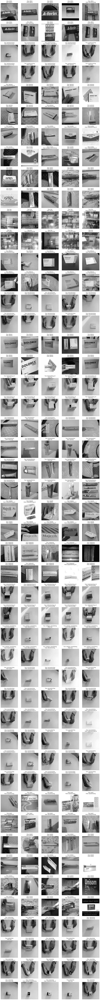

In [38]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import torch

# Ensure 'image_class_dict' exists and contains {image_path: class_name} pairs
true_labels = []
pred_labels = []
labels = list(set(labels))  # Ensure labels contain unique classes

# Set number of images per row
images_per_row = 5
total_images = len(image_class_dict)

# Print total number of images to verify
print(f"Total number of images: {total_images}")

# Determine the number of rows
rows = (total_images // images_per_row) + (total_images % images_per_row > 0)

# Set figure size
plt.figure(figsize=(15, 3 * rows))

# Iterate through all images
for idx, (image_path, true_label) in enumerate(image_class_dict.items()):
    print(img_path)
    img_path = os.path.join(TRAIN_DIRECTORY, image_path)
    
    try:
        image = Image.open(img_path).convert("RGB")  # Ensure image is in RGB format

        # Preprocess image and tokenize text labels
        inputs = processor(text=labels, images=image, return_tensors="pt", padding=True)

        # Get predictions
        with torch.no_grad():
            outputs = model(**inputs)
            probs = outputs.logits_per_image.softmax(dim=1)  # Convert to probabilities

        # Get predicted label
        predicted_label = labels[probs.argmax().item()]

        true_labels.append(true_label)
        pred_labels.append(predicted_label)

        # Plot the image
        plt.subplot(rows, images_per_row, idx + 1)
        plt.imshow(image)
        plt.title(f"True: {true_label}\nPred: {predicted_label}", fontsize=10)
        plt.axis('off')  # Hide axis

        # Print for debugging
        print(f"Image: {image_path} | True: {true_label} | Predicted: {predicted_label}")

    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


In [44]:
# Compute accuracy
accuracy = accuracy_score(true_labels, pred_labels)
print(f"Zero-Shot CLIP Accuracy: {accuracy:.2f}")

# Generate classification report
print(classification_report(true_labels, pred_labels, labels=labels, target_names=labels))


Zero-Shot CLIP Accuracy: 0.26
                      precision    recall  f1-score   support

         hametanKrem       0.50      0.40      0.44        10
             arveles       1.00      0.10      0.18        10
       hametanMerhem       0.00      0.00      0.00        10
             apranax       0.58      0.70      0.64        10
            dikloron       0.00      0.00      0.00        10
        apodonorm5mg       0.00      0.00      0.00        10
     midazolam5mg_ml       0.03      0.10      0.05        10
              unisom       1.00      0.50      0.67        10
            terbisil       1.00      0.60      0.75        10
       oxycontin15mg       0.00      0.00      0.00        10
nobligan_retard200mg       0.00      0.00      0.00        10
     fentanyl50ug_ml       0.25      0.10      0.14        10
            metpamid       1.00      0.60      0.75        10
           valium5mg       0.75      0.30      0.43        10
         oxynorm10mg       0.06      0.

/opt/conda/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/conda/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


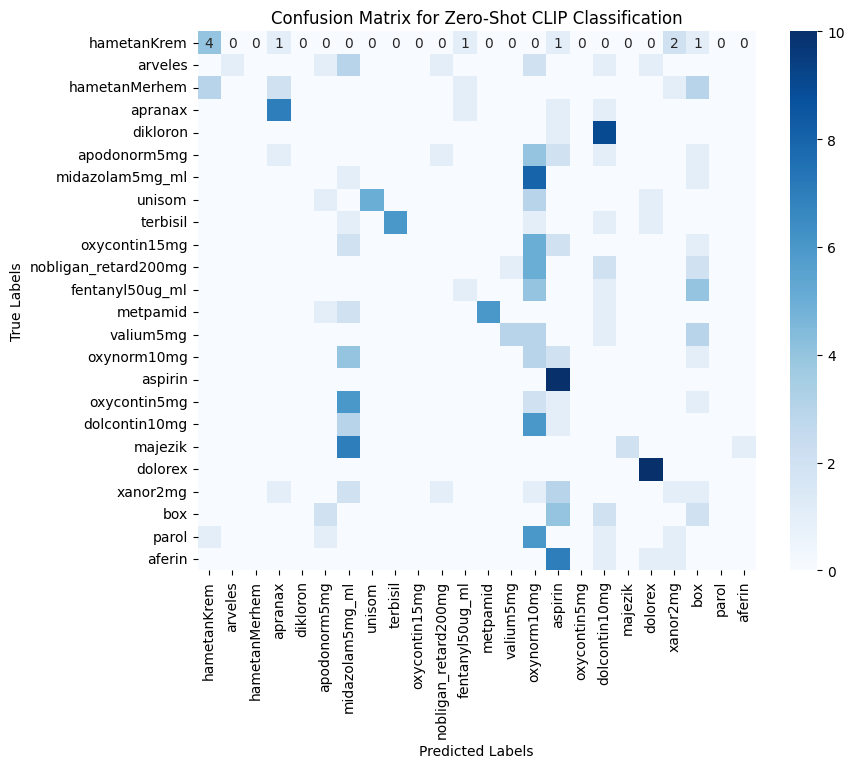

In [40]:
# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, pred_labels, labels=labels)

# Plot confusion matrix
plt.figure(figsize=(9, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix for Zero-Shot CLIP Classification")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()